# Clustering Conformations coordinate based using Python Libraries

## Import dependencies

In [1]:
import numpy as np
import pickle
from scipy.cluster.hierarchy import dendrogram, linkage, leaves_list, to_tree, centroid, cut_tree,fcluster
from matplotlib import pyplot as plt
from helper import info,calc_coord_based_matrix,threshold_remove,multirun, plot_tsne, real_cluster_map
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

## calc_coord_based_matrix(threshold, segments = [(34,55),(144,165)])
A function which uses the coordinate based method clustering to calculate the input matrix. __This is required everytime the user wants to do a different experiment with different segments or threshold__
### threshold: 
minimum number of missing residues before discarded, all conformations with missing residues ≥ threshold are discarded.
### segments:
A list of tuples containing the 0-indexed start and end of the specific segments the user wants to analyse.

## __Note__: A new set of reduced_chains and matrix_seg need to be imported in everytime calc_cord_based_matrix is called

## Multiirun
### Usage: (annotated_dict_list, segments = [(34,54),(144,165)], threshold=7,no_clusters=3, iter=10)

In [2]:
calc_coord_based_matrix(1, segments = [(34,55),(144,165)])

Threshold: 1 amount removed: 333
imputations done: 0


matrix([[ 6.90527201e-01, -4.47954130e+00],
        [-3.10398936e+00, -6.17232323e+00],
        [ 9.86400843e-01,  2.21217418e+00],
        [ 9.10877705e-01,  2.19703484e+00],
        [-3.16406631e+00,  2.92498493e+00],
        [ 1.41526127e+00,  3.14575315e+00],
        [ 5.14825773e+00,  2.36335039e+00],
        [ 4.88156176e+00,  3.66075850e+00],
        [ 2.00860810e+00,  4.09779167e+00],
        [-2.89792109e+00, -2.96659994e+00],
        [-2.80812454e+00, -8.44140911e+00],
        [-1.45328175e-02, -7.61882162e+00],
        [ 7.71395490e-02, -3.14566016e+00],
        [-2.31283641e+00, -5.48275614e+00],
        [-2.24618316e+00, -5.43561935e+00],
        [-2.90661073e+00, -5.84748077e+00],
        [-3.55357766e+00, -6.17293644e+00],
        [-3.59096456e+00, -6.21332884e+00],
        [ 9.49160290e+00, -4.58815527e+00],
        [ 8.86634946e-01, -4.92881775e+00],
        [-2.40610766e+00, -7.29253387e+00],
        [ 9.75143552e-01, -4.83845043e+00],
        [-3.88166237e+00, -6.133

In [3]:
with open("reduced_chains_list.var","rb") as reduced_chains_list_var:
   reduced_chains_list = pickle.load(reduced_chains_list_var)
   reduced_chains_list_var.close()
#print(f"chains_list: {chains_list}")
with open("structures/opened_active.var", "rb") as open_active_var:
    open_active_list = pickle.load(open_active_var)
    open_active_var.close()
with open("structures/closed_inactive.var", "rb") as closed_inactive_var:
    closed_inactive_list = pickle.load(closed_inactive_var)
    closed_inactive_var.close()
with open("structures/opened_inactive.var", "rb") as open_inactive_var:
    open_inactive_list = pickle.load(open_inactive_var)
    open_inactive_var.close()

print(f"open_active: {len(open_active_list)}")
print(f"closed_inactive: {len(closed_inactive_list)}")
print(f"open_inactive: {len(open_inactive_list)}")
annotated_dict_list_codes= {"open_active": open_active_list, "closed_inactive": closed_inactive_list, "open_inactive": open_inactive_list} #dictionary of codes list
annotated_dict_list ={"open_active": list(), "closed_inactive": list(), "open_inactive": list()} #dictionary of list of indices
for i,conformation in enumerate(reduced_chains_list):
    for j,l in enumerate(annotated_dict_list_codes):
        if conformation in annotated_dict_list_codes[l]:
            #print(f"l: {l}")
            annotated_dict_list[l].append(i)
print(f"reduced lengths")
for key in annotated_dict_list:
    print(f"{key}: {len(annotated_dict_list[key])}")

open_active: 162
closed_inactive: 277
open_inactive: 92
reduced lengths
open_active: 123
closed_inactive: 14
open_inactive: 61


In [4]:
with open("matrix_seg_coords.var", "rb") as matrix_seg_coords_var:
   matrix_seg_coords = (pickle.load(matrix_seg_coords_var))
   matrix_seg_coords_var.close()
print(f"matrix_seg_coords: {np.shape(matrix_seg_coords)}")
print(f"reduced_chains_list: {np.shape(reduced_chains_list)}")


matrix_seg_coords: (198, 2)
reduced_chains_list: (198,)


### Experiment 1
Threshold = 1, keep only conformations with 0 missing residues on the specific segments
### Analysis
Although still an F1 score of 0.92
This is really good, although 3 clear clusters weren't found in the real cluster map, the plot still managed to give the 3 clusters to above 90% accuracy
Note: the classification results F1 score are based on the MICE imputation which is semi-random based on the samples used.

shape axis1: (198,) axis2: (198,)
group: open_active
group: closed_inactive
group: open_inactive


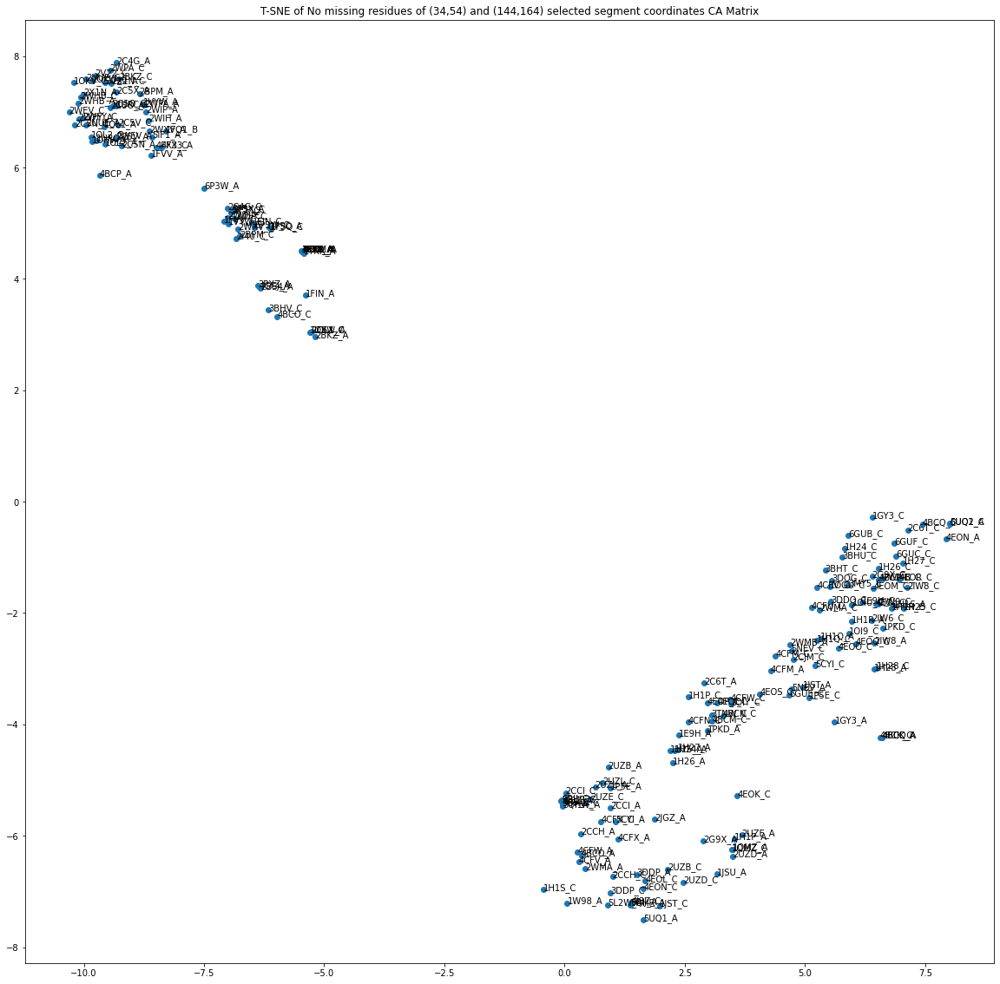

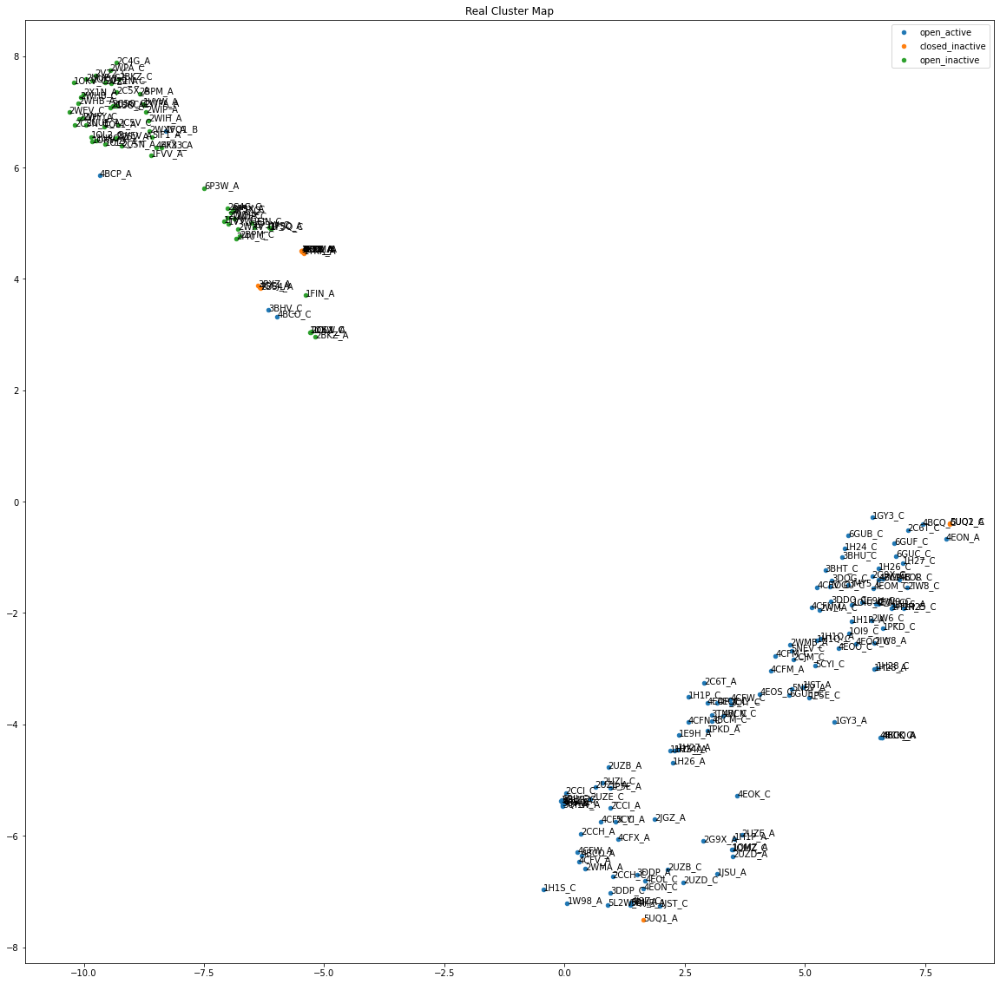

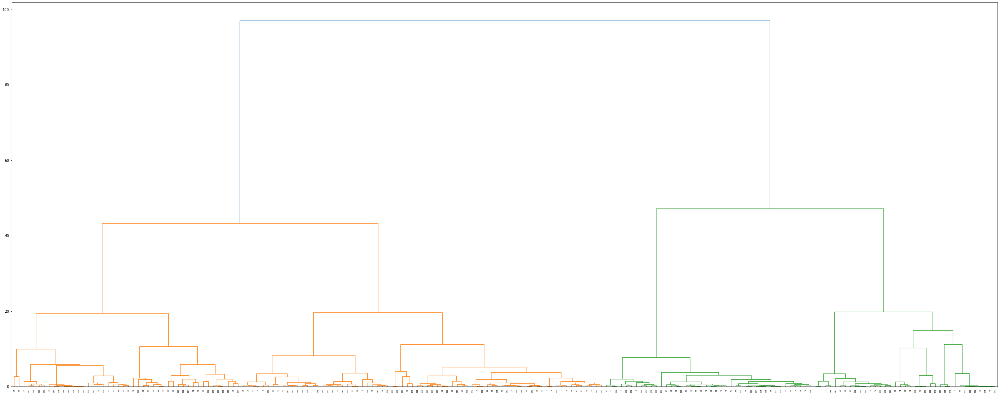

Dendrogram plotted
------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 119
cluster 1, length: 37
cluster 2, length: 42
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_active       0.974790  0.943089  0.958678
closed_inactive   0.297297  0.785714  0.431373
open_inactive     0.952381  0.655738  0.776699
Averages          0.741489  0.794847  0.722250
out:
                            Real open_active  Real closed_inactive  Real open_inactive
Predicted open_active                   116                     3                   0
Predicted closed_inactive                 5                    11                  21
Predicted open_inactive                   2                     0                  40
-----------------------------------------------------------

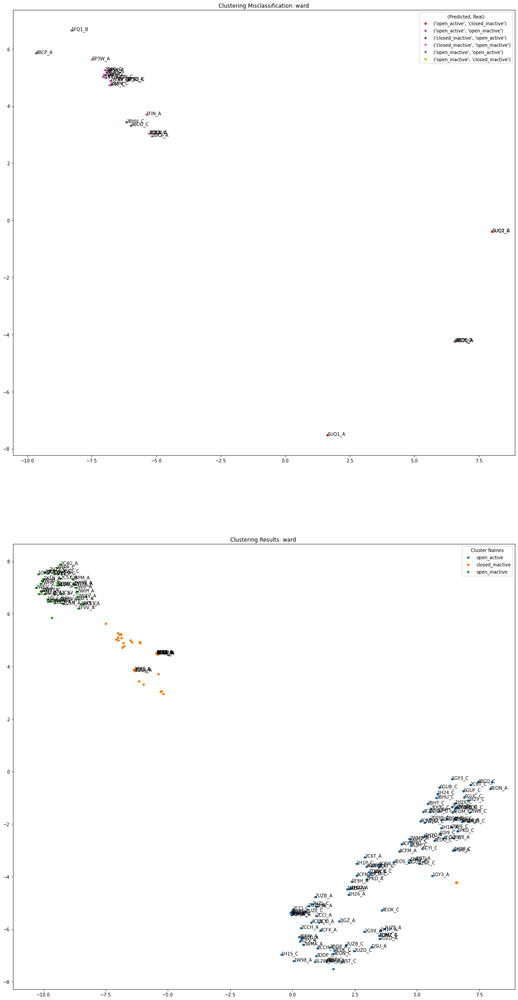

(#missing residues, percentage) [(0, 0.15656565656565657)]
miclassified_missing (list where value at i is amount of misclassified and i is amount of missing residues:
 [31]
totals_missing (list where value at i is number of conformations and i is amount of missing residues:
 [198]


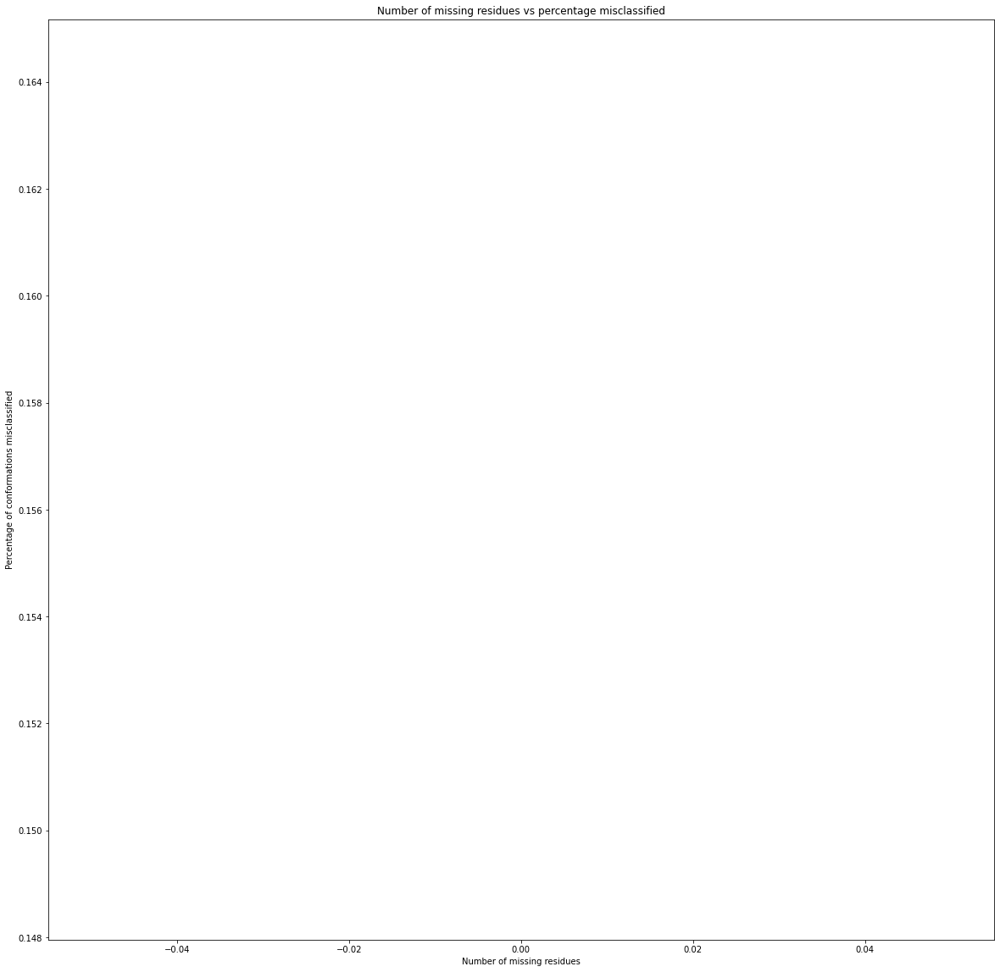

In [5]:
info(matrix_seg_coords,"No missing residues of (34,54) and (144,164) selected segment coordinates CA", reduced_chains_list,annotated_dict_list, kernel="linear",hierarchy_method = "ward", no_clusters=3,tsne=True)

In [6]:
multirun(annotated_dict_list,segments =[(34,54),(144,164)], threshold=1,iter=20)

Threshold: 1 amount removed: 333
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
Iterations: 20, f1_avg: 0.6787654909038995, p_avg: 0.692887864661116, r_avg: 0.6983984184104137


[[0.7616421754279653, 0.7546565148191164, 0.7834390053502408],
 [0.6011120087845564, 0.6197041847041848, 0.6167247386759581],
 [0.8691388499298737, 0.8630567420902452, 0.882145554476622],
 [0.7647019174442574, 0.7676307031669349, 0.8091557027982458],
 [0.6113857954808003, 0.6098825831702545, 0.6226366596218654],
 [0.5862043418566399, 0.6013601953601954, 0.5757665187893096],
 [0.7066618417424868, 0.7498245614035088, 0.7783648445383751],
 [0.5941775082499697, 0.6254767353165521, 0.6071222304728902],
 [0.5891645781119466, 0.6315192743764173, 0.6079695106084549],
 [0.8015073251007916, 0.7922544631373154, 0.8208875180086695],
 [0.8274564717395934, 0.8158589288470443, 0.8501615226925102],
 [0.6435797343052694, 0.6503584229390681, 0.642533462805354],
 [0.656904046658332, 0.6490819967986651, 0.6756757614414552],
 [0.5538795911357471, 0.6016633890527695, 0.542218033421552],
 [0.8842780026990553, 0.8689196108550946, 0.9087095320601918],
 [0.7775842044134728, 0.775304569155114, 0.8330096532815445

### Experiment 2
Threshold = 298, we keep all of our conformations
### Analysis
Although still an F1 score of 0.56, which isn't as bad as the RMSD matrix, the data shows 4 obvious clusters probably resulting from the value imputation. In fact,plotting amount of residues missing vs precentage of misclassification, the error obviously comes from the imputation since there's a clear upward trend in misclassification (obvious covariance).
Note: the classification results F1 score are based on the MICE imputation which is semi-random based on the samples used.

In [3]:
calc_coord_based_matrix(297)

with open("reduced_chains_list.var","rb") as reduced_chains_list_var:
   reduced_chains_list = pickle.load(reduced_chains_list_var)
   reduced_chains_list_var.close()
#print(f"chains_list: {chains_list}")
with open("structures/opened_active.var", "rb") as open_active_var:
    open_active_list = pickle.load(open_active_var)
    open_active_var.close()
with open("structures/closed_inactive.var", "rb") as closed_inactive_var:
    closed_inactive_list = pickle.load(closed_inactive_var)
    closed_inactive_var.close()
with open("structures/opened_inactive.var", "rb") as open_inactive_var:
    open_inactive_list = pickle.load(open_inactive_var)
    open_inactive_var.close()

print(f"open_active: {len(open_active_list)}")
print(f"closed_inactive: {len(closed_inactive_list)}")
print(f"open_inactive: {len(open_inactive_list)}")
annotated_dict_list_codes= {"open_active": open_active_list, "closed_inactive": closed_inactive_list, "open_inactive": open_inactive_list} #dictionary of codes list
annotated_dict_list ={"open_active": list(), "closed_inactive": list(), "open_inactive": list()} #dictionary of list of indices
for i,conformation in enumerate(reduced_chains_list):
    for j,l in enumerate(annotated_dict_list_codes):
        if conformation in annotated_dict_list_codes[l]:
            #print(f"l: {l}")
            annotated_dict_list[l].append(i)
print(f"reduced lengths")
for key in annotated_dict_list:
    print(f"{key}: {len(annotated_dict_list[key])}")

with open("matrix_seg_coords.var", "rb") as matrix_seg_coords_var:
   matrix_seg_coords = (pickle.load(matrix_seg_coords_var))
   matrix_seg_coords_var.close()
print(f"matrix_seg_coords: {np.shape(matrix_seg_coords)}")
print(f"reduced_chains_list: {np.shape(reduced_chains_list)}")


Threshold: 297 amount removed: 0
imputations done: 3515
open_active: 162
closed_inactive: 277
open_inactive: 92
reduced lengths
open_active: 162
closed_inactive: 277
open_inactive: 92
matrix_seg_coords: (531, 2)
reduced_chains_list: (531,)


shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive
shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive


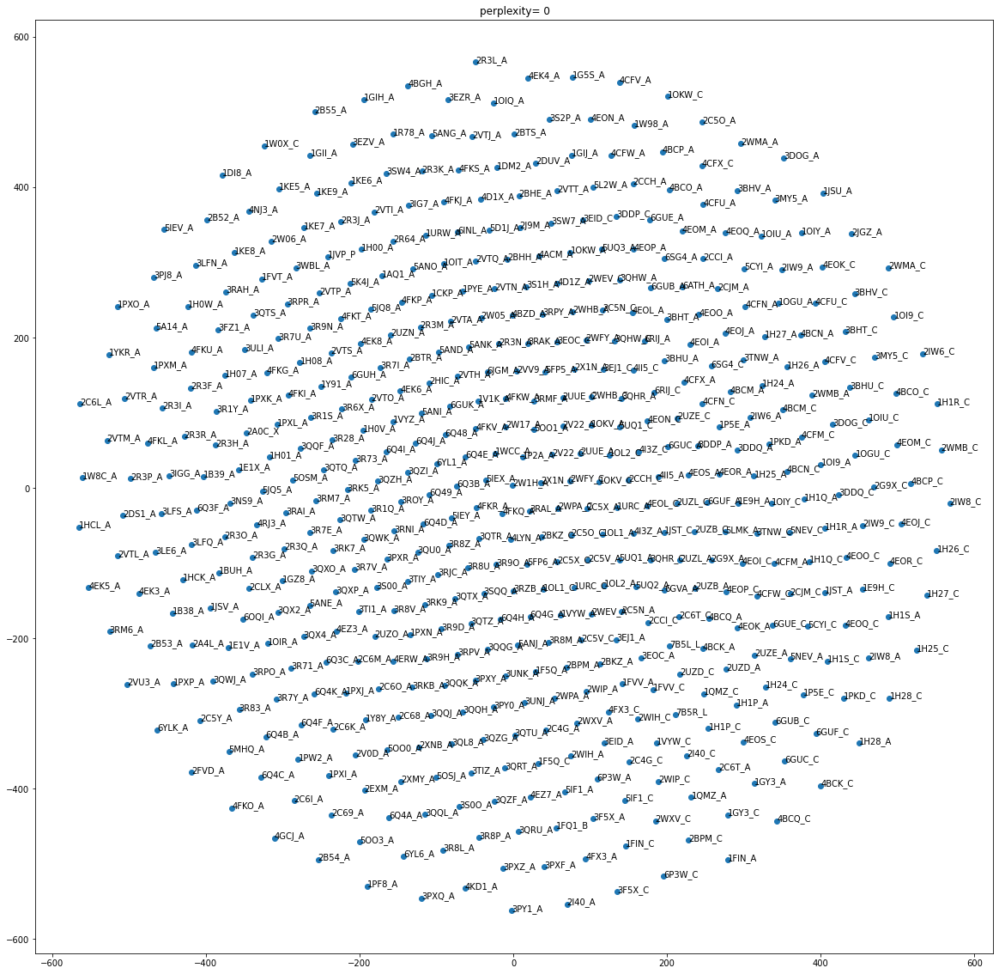

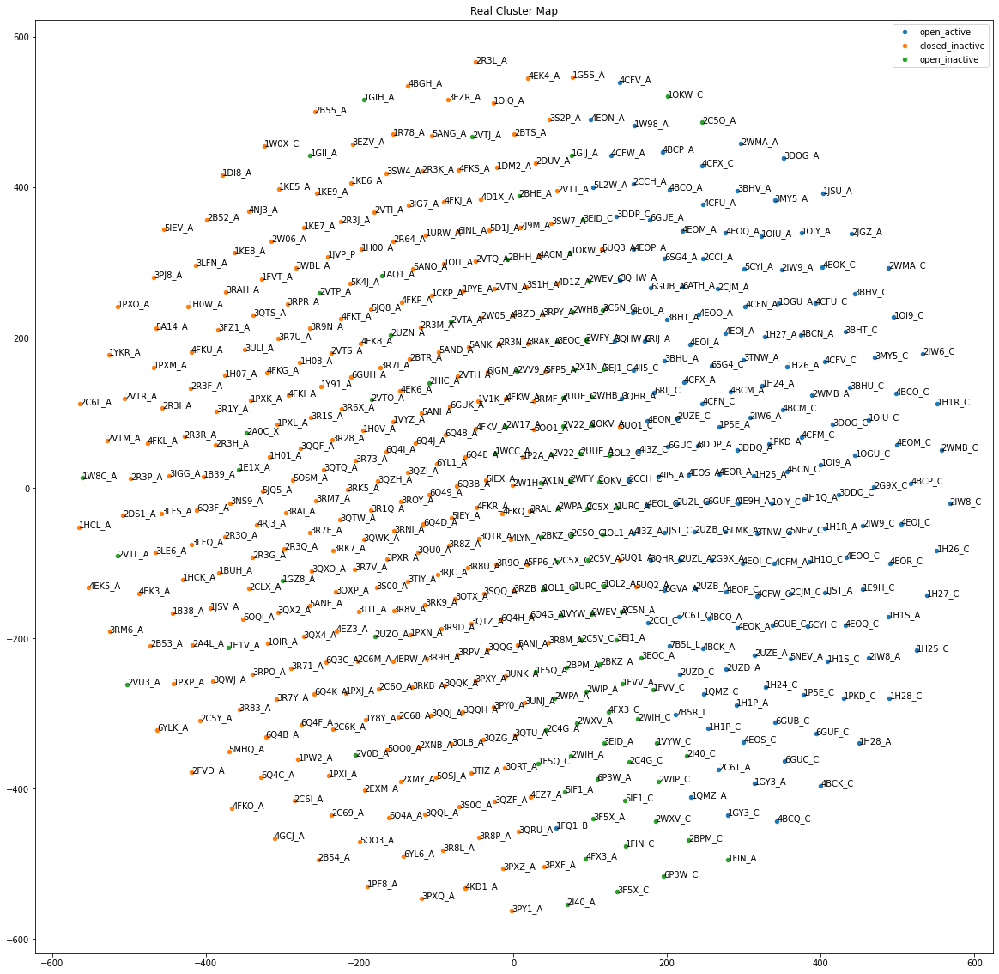

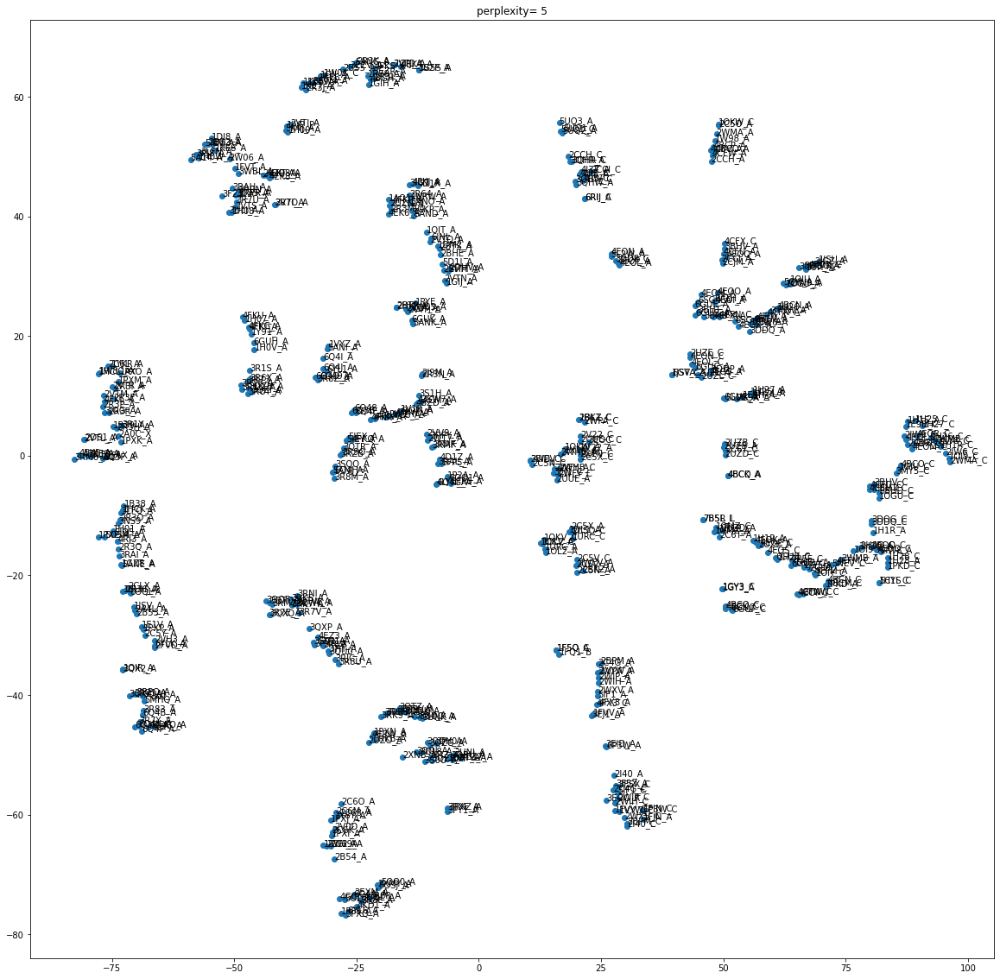

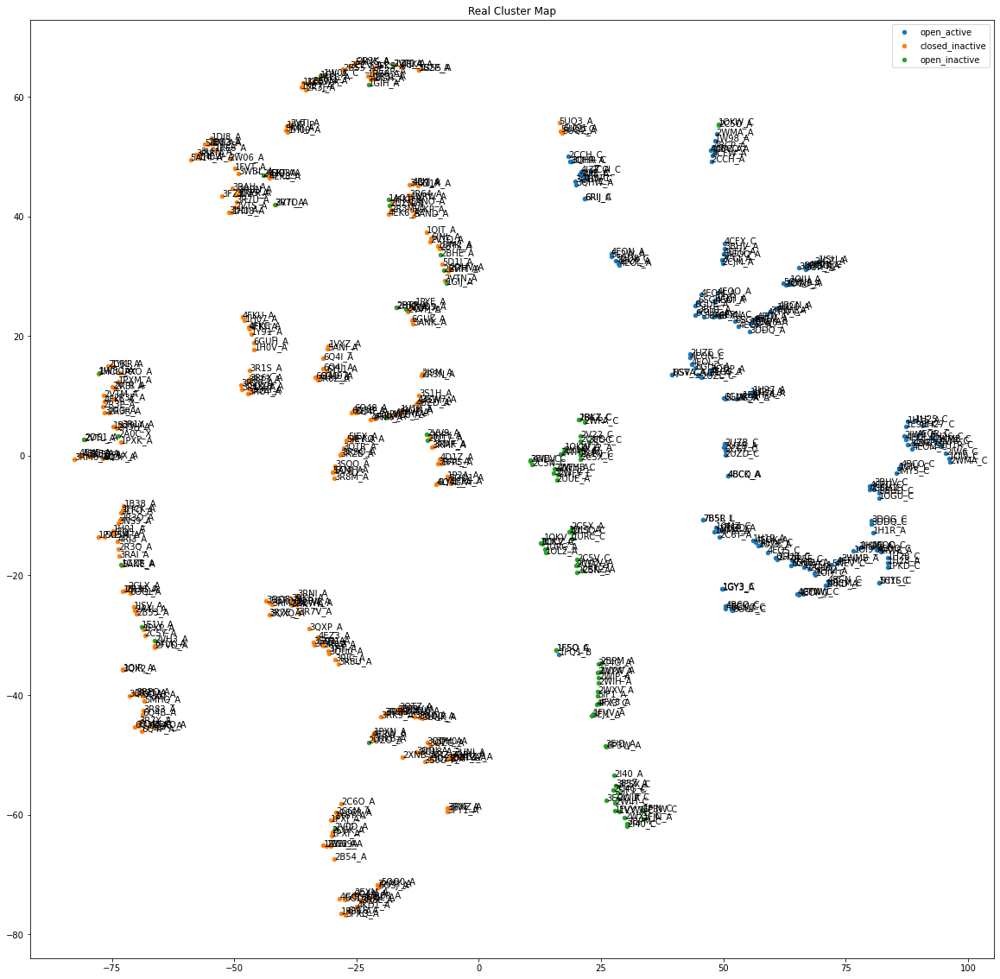

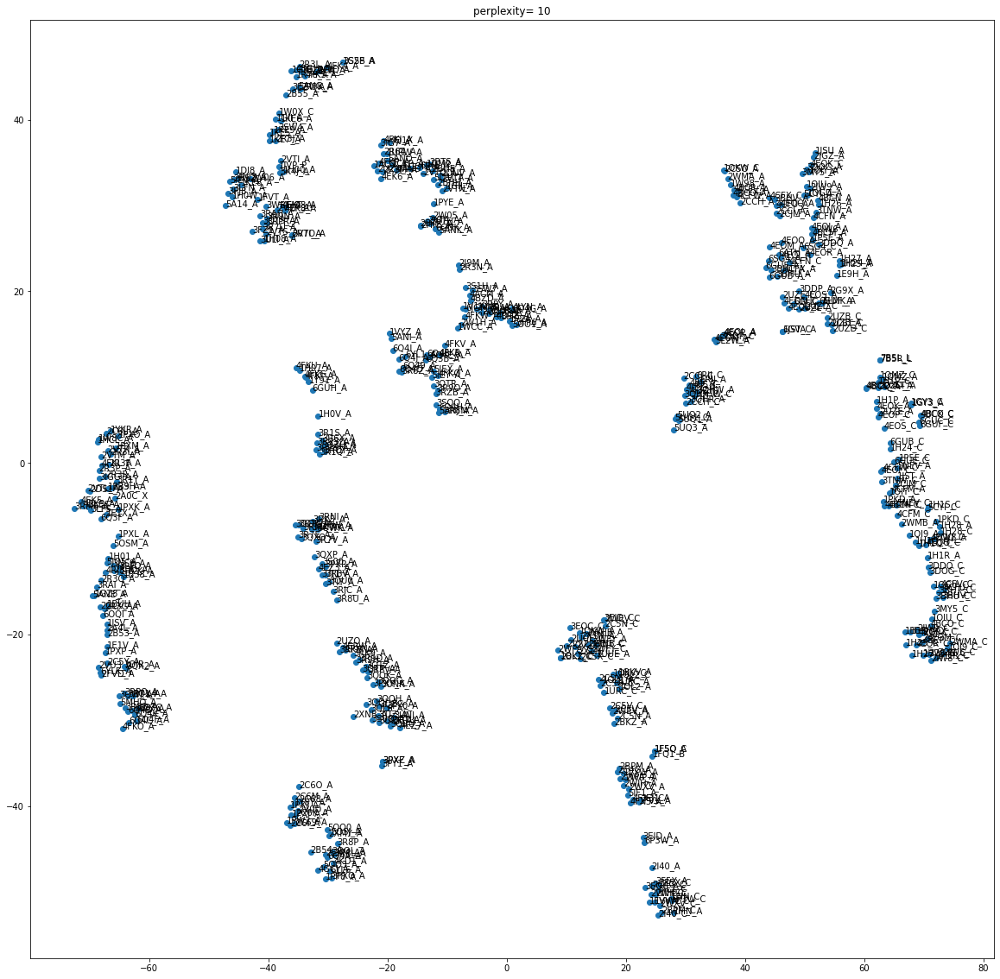

...

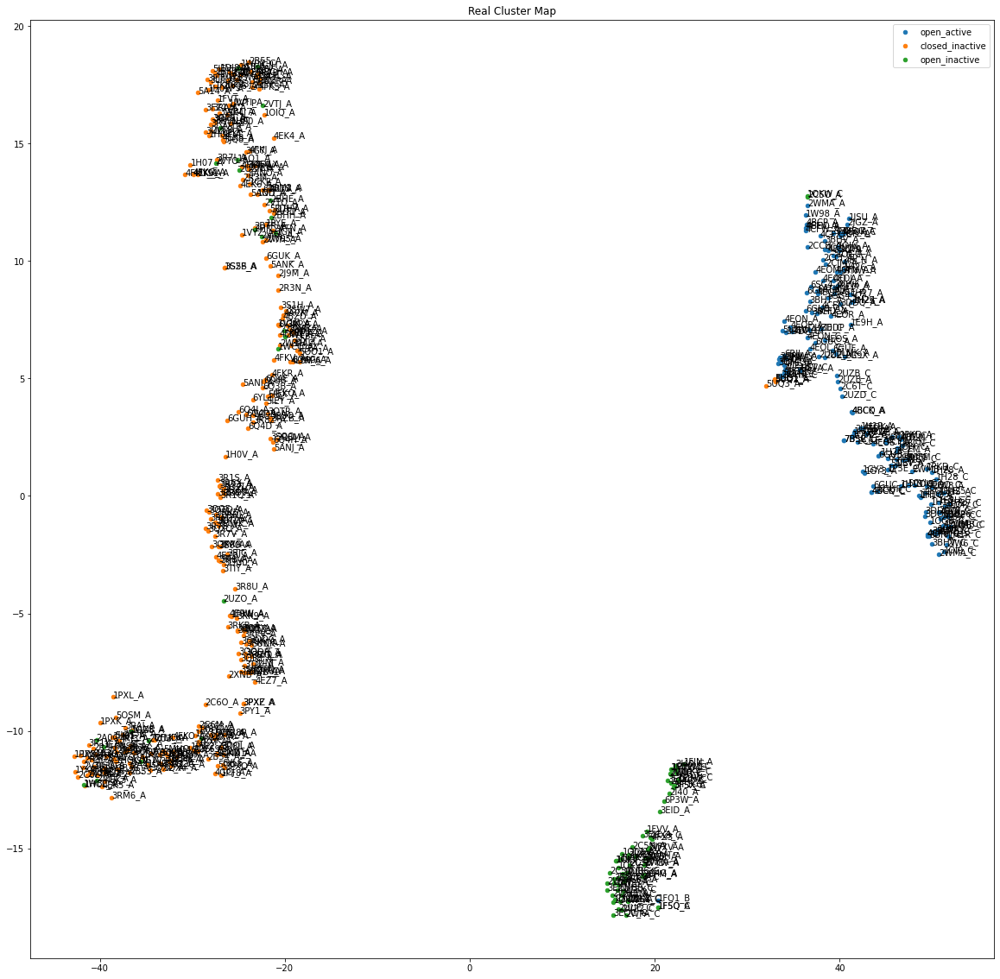

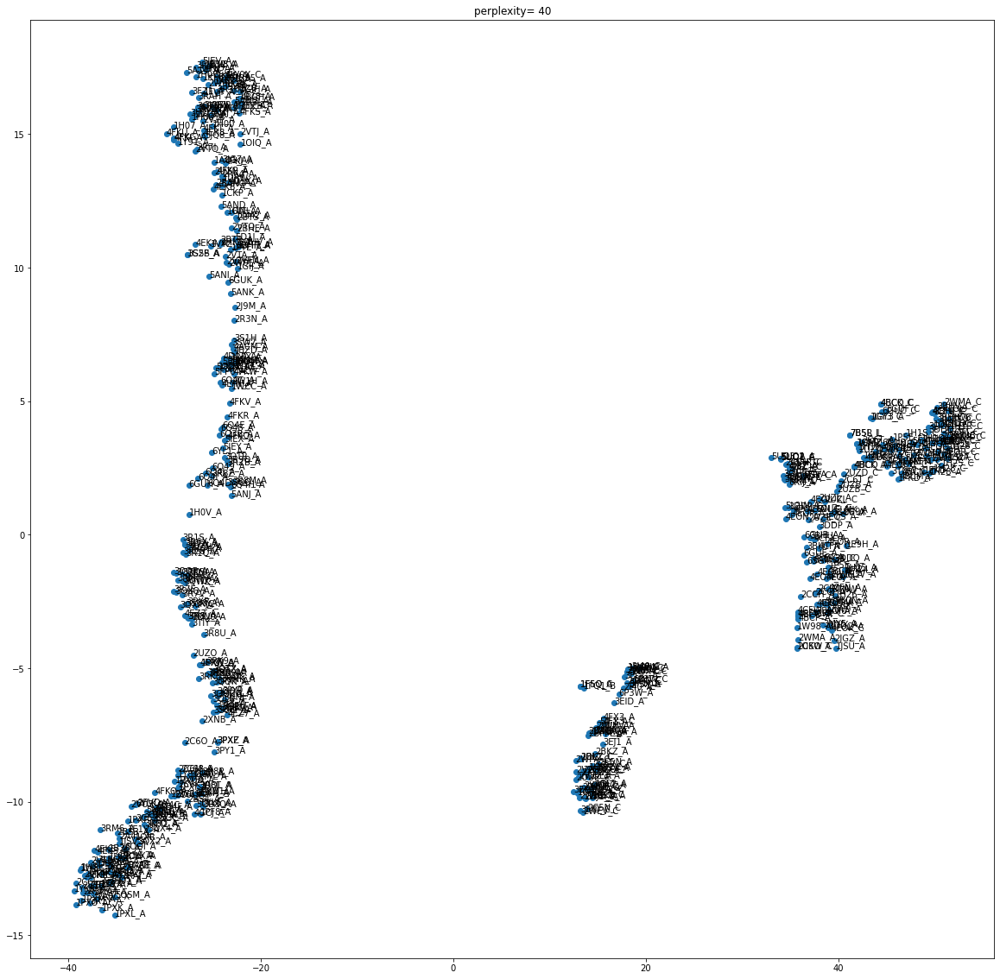

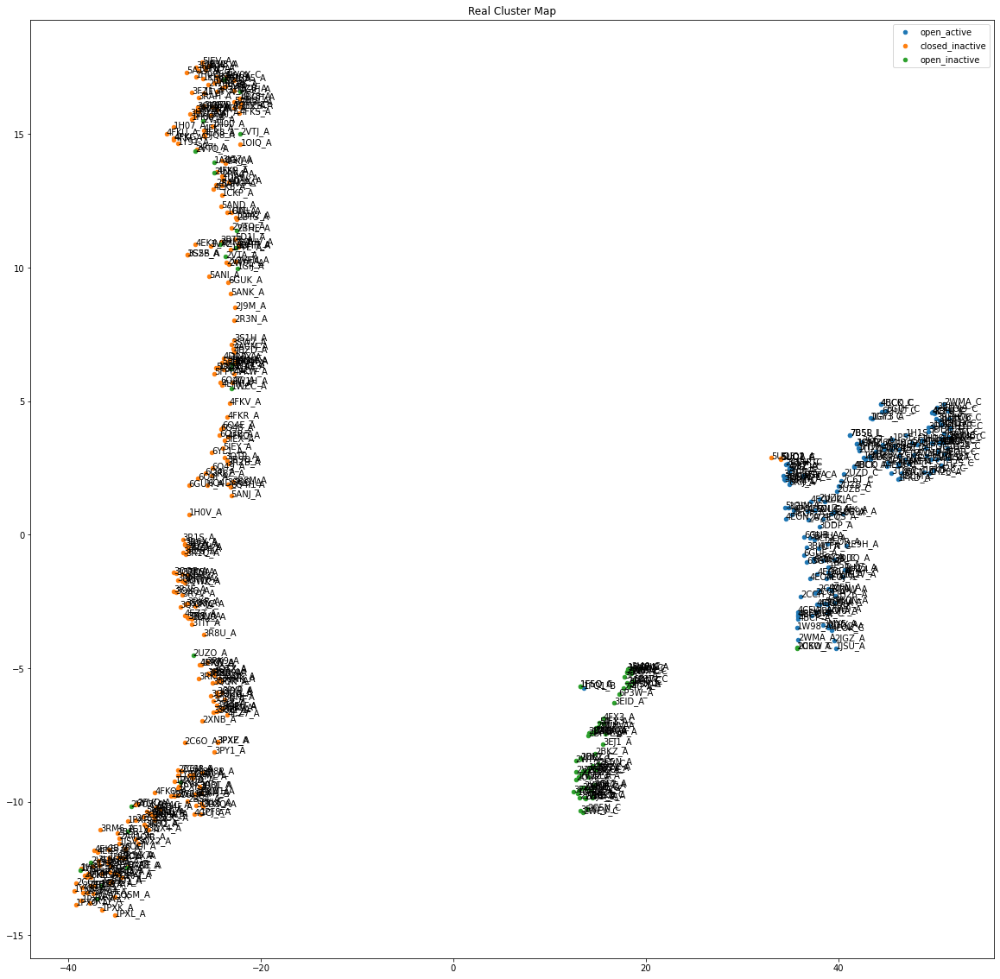

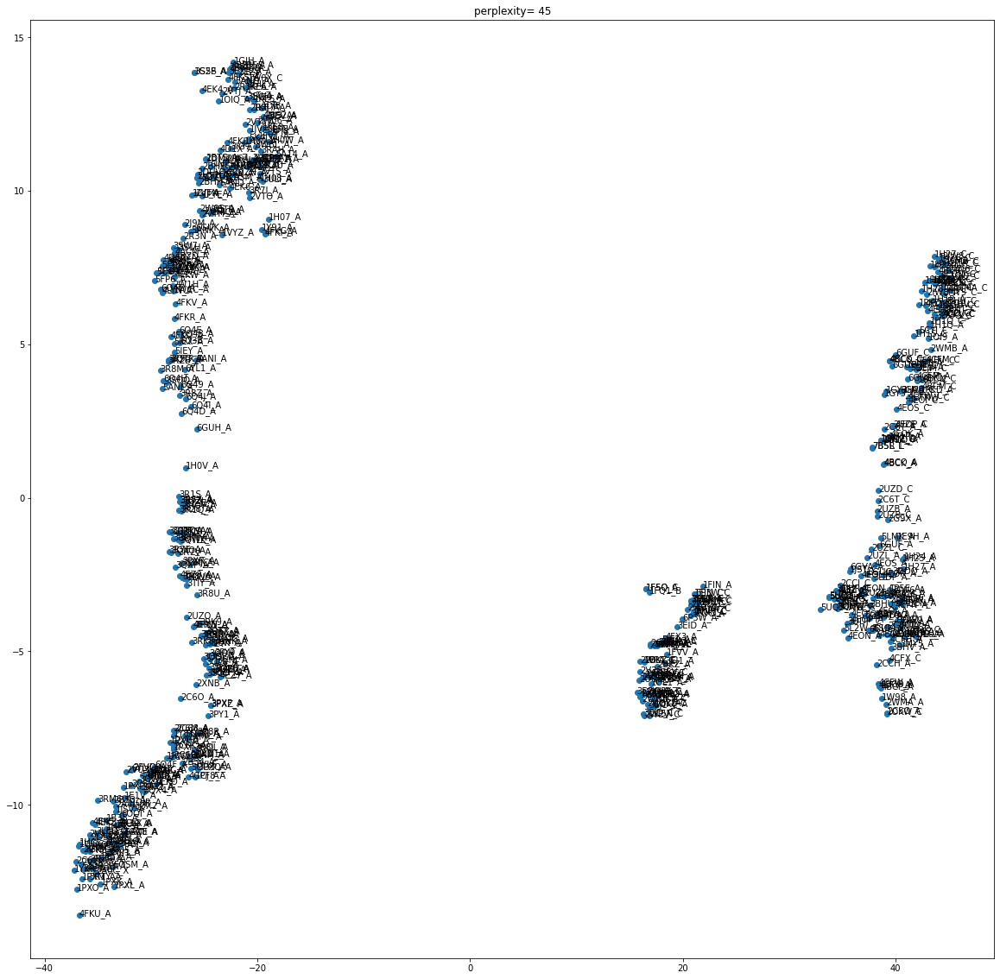

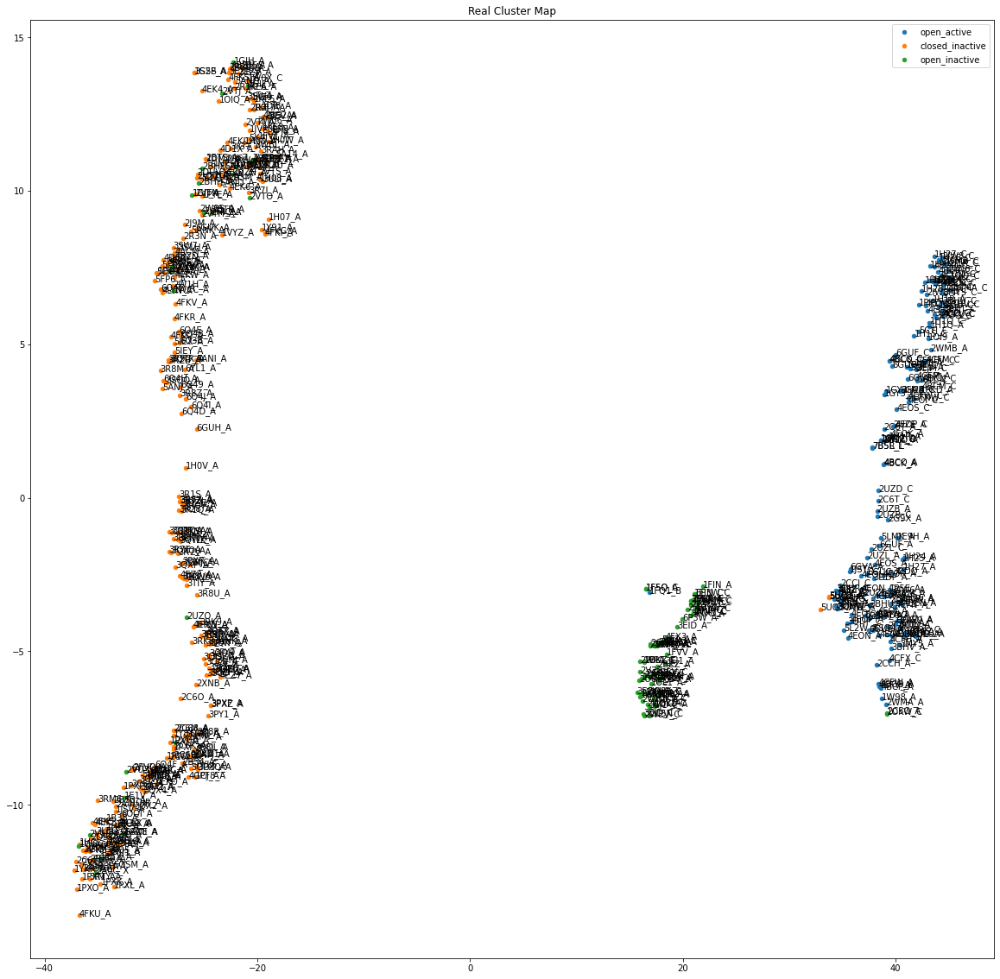

In [8]:
for i in range(50)[::5]:
    reduced_mat = plot_tsne(matrix_seg_coords,reduced_chains_list,title=f"perplexity= {i}",perplexity = i)
    real_cluster_map(reduced_mat,annotated_dict_list, reduced_chains_list)

shape axis1: (531,) axis2: (531,)
group: open_active
group: closed_inactive
group: open_inactive


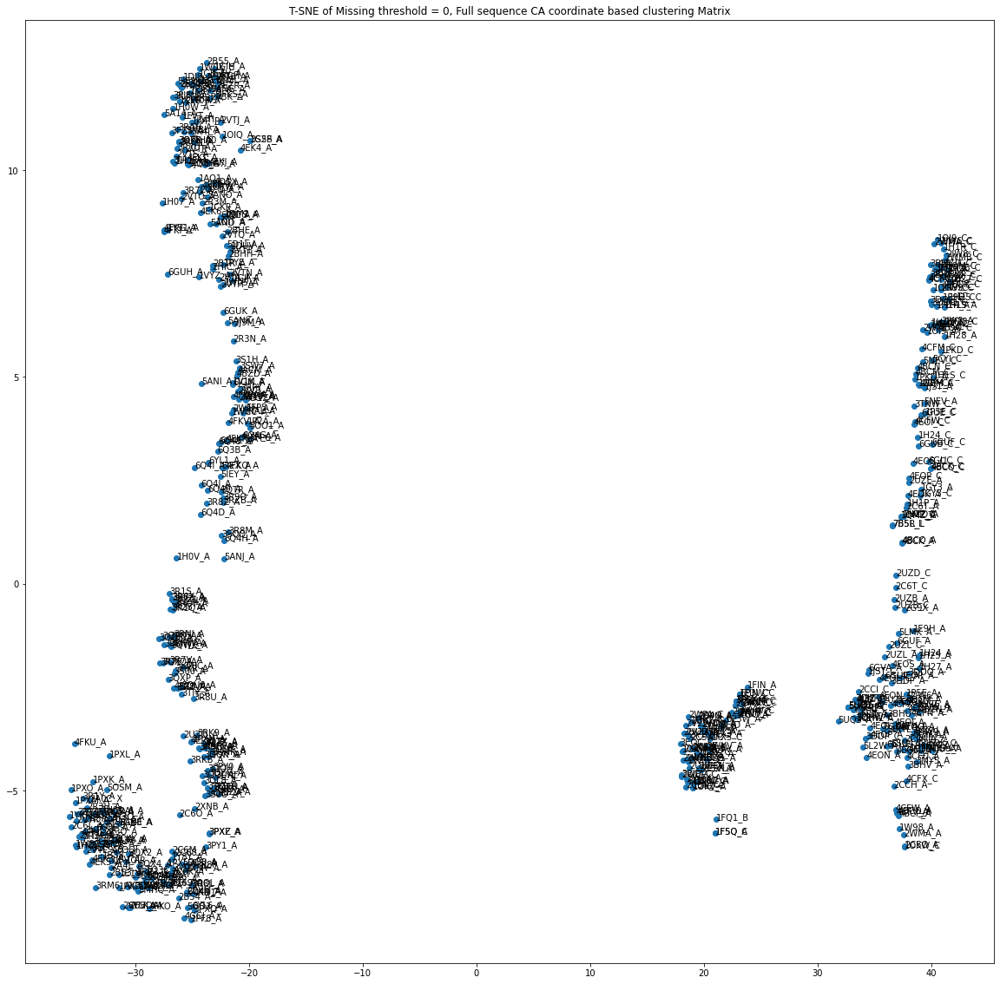

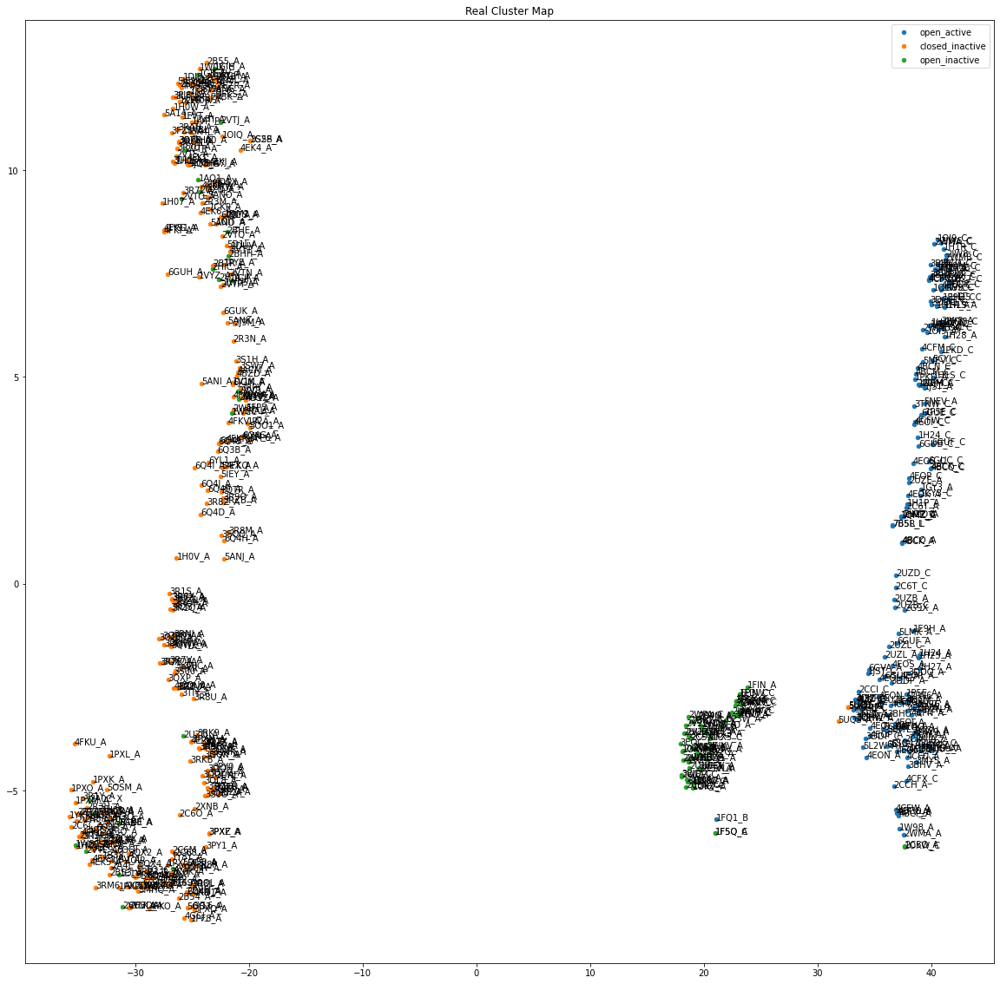

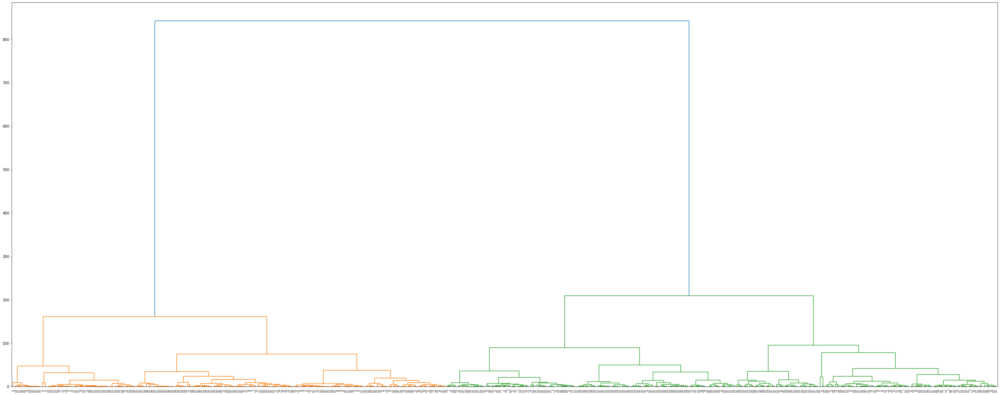

Dendrogram plotted
------------------------------------------------------------
STATISTICS
------------------------------------------------------------
cluster 0, length: 141
cluster 1, length: 156
cluster 2, length: 234
------------------------------------------------------------
MACRO AVERAGES
------------------------------------------------------------
                 Precision    Recall  F1 score
open_inactive     0.106383  0.163043  0.128755
closed_inactive   0.942308  0.530686  0.678984
open_active       0.692308  1.000000  0.818182
Averages          0.580333  0.564576  0.541974
out:
                            Real open_inactive  Real closed_inactive  Real open_active
Predicted open_inactive                    15                   126                 0
Predicted closed_inactive                   9                   147                 0
Predicted open_active                      68                     4               162
---------------------------------------------------------

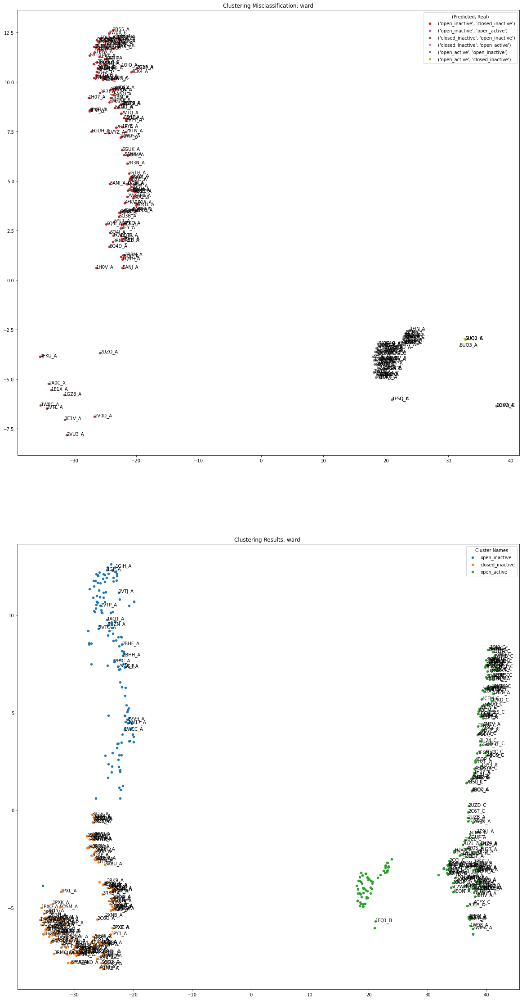

(#missing residues, percentage) [(0, 0.32323232323232326), (1, 0.0), (2, 0.0), (3, 0.2), (4, 0.024390243902439025), (5, 0.3), (6, 0.3076923076923077), (7, 0.2), (8, 0.20833333333333334), (9, 0.08333333333333333), (10, 1.0), (11, 0.625), (12, 0.8571428571428571), (13, 1.0), (14, 0.75), (15, 0.8), (16, 0.9523809523809523), (17, 0.875), (18, 0.8888888888888888), (19, 0.7692307692307693), (20, 0.9166666666666666), (21, 0.9), (22, 0.7777777777777778), (23, 1.0), (24, 0.75), (25, 0.6666666666666666), (26, 1.0), (27, 1.0), (29, 1.0), (31, 1.0)]
miclassified_missing (list where value at i is amount of misclassified and i is amount of missing residues:
 [64, 0, 0, 4, 2, 3, 4, 3, 5, 1, 4, 5, 6, 3, 3, 8, 20, 7, 8, 10, 11, 9, 7, 4, 6, 2, 3, 3, 0, 1, 0, 1]
totals_missing (list where value at i is number of conformations and i is amount of missing residues:
 [198, 2, 14, 20, 82, 10, 13, 15, 24, 12, 4, 8, 7, 3, 4, 10, 21, 8, 9, 13, 12, 10, 9, 4, 8, 3, 3, 3, 0, 1, 0, 1]


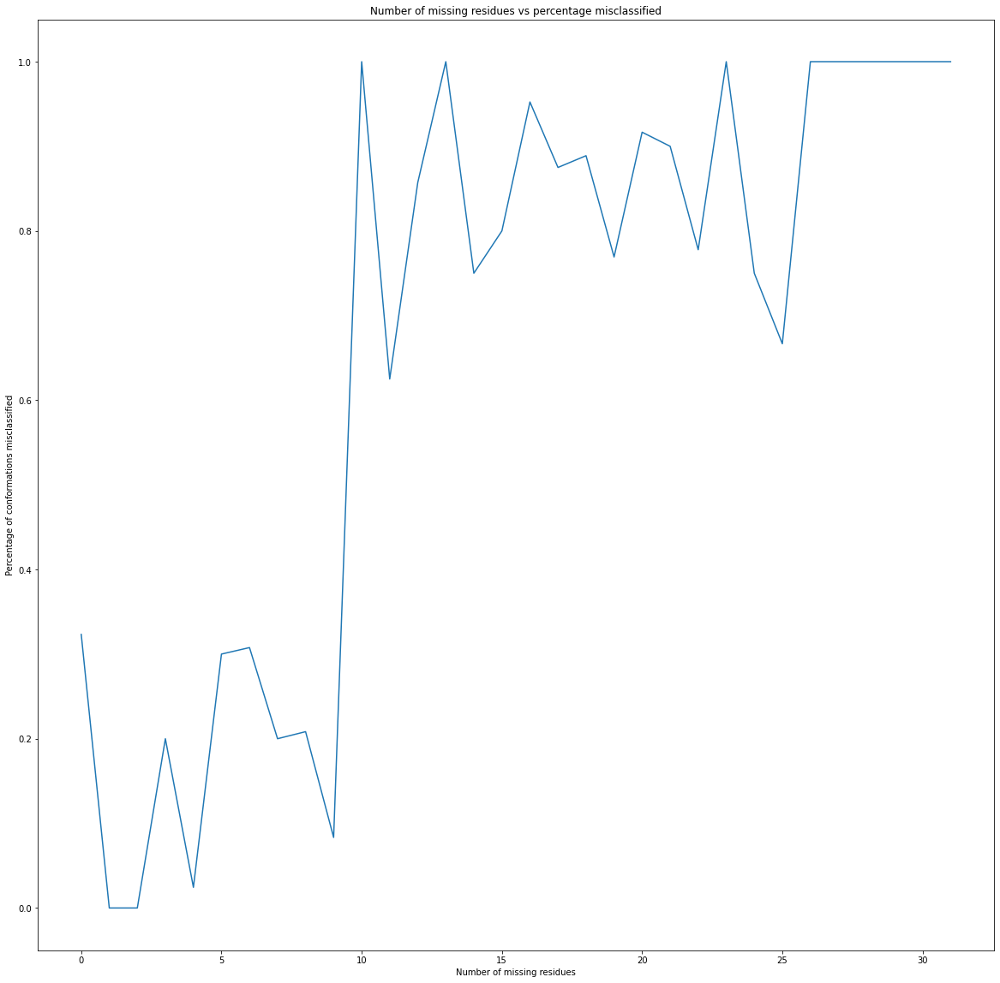

In [9]:
info(matrix_seg_coords,"Missing threshold = 0, Full sequence CA coordinate based clustering", reduced_chains_list,annotated_dict_list, kernel="linear",hierarchy_method = "ward", no_clusters=3,tsne=True)

### Multi Run
The results vary upon MICE imputation results, thus multirun will find the average over n different imputation instances

In [10]:
multirun(annotated_dict_list,threshold=297,iter = 50)

Threshold: 297 amount removed: 0
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
imputations done: 3515
i

[[0.5340426281132254, 0.5747205645543242, 0.5585465390048658],
 [0.9142414022707305, 0.9404731829804174, 0.8968814774767093],
 [0.554358352938892, 0.5778086990846963, 0.5738914370866445],
 [0.9183591616524088, 0.9501135287763947, 0.8989390906454336],
 [0.5639776305628738, 0.5879804617797674, 0.5910767540417518],
 [0.5511061732508433, 0.5811370988430662, 0.5724949342862107],
 [0.5396907525840101, 0.5787500514975487, 0.5616776894790114],
 [0.5566512576022605, 0.5820270850463484, 0.5793660251926005],
 [0.5512261148006448, 0.5777534064473246, 0.5749016731550435],
 [0.5503319109241414, 0.5800764847069158, 0.5713046449543423],
 [0.5380145766715639, 0.5740361545462066, 0.5616646093764635],
 [0.5519016121506003, 0.5796634737811209, 0.5728440599863193],
 [0.5589952084602808, 0.5814918265306931, 0.5800642765928173],
 [0.54555776701753, 0.5773234977668723, 0.566478087114129],
 [0.5337200373254533, 0.5681789737171464, 0.5559838078019421],
 [0.9178569489385507, 0.9441695870267299, 0.900504665882506

## Run with 0 missing residues on the segments 144 to 166

In [11]:
calc_coord_based_matrix(threshold=1, segments= [(143,165)])

with open("reduced_chains_list.var","rb") as reduced_chains_list_var:
   reduced_chains_list = pickle.load(reduced_chains_list_var)
   reduced_chains_list_var.close()
#print(f"chains_list: {chains_list}")
with open("structures/opened_active.var", "rb") as open_active_var:
    open_active_list = pickle.load(open_active_var)
    open_active_var.close()
with open("structures/closed_inactive.var", "rb") as closed_inactive_var:
    closed_inactive_list = pickle.load(closed_inactive_var)
    closed_inactive_var.close()
with open("structures/opened_inactive.var", "rb") as open_inactive_var:
    open_inactive_list = pickle.load(open_inactive_var)
    open_inactive_var.close()

print(f"open_active: {len(open_active_list)}")
print(f"closed_inactive: {len(closed_inactive_list)}")
print(f"open_inactive: {len(open_inactive_list)}")
annotated_dict_list_codes= {"open_active": open_active_list, "closed_inactive": closed_inactive_list, "open_inactive": open_inactive_list} #dictionary of codes list
annotated_dict_list ={"open_active": list(), "closed_inactive": list(), "open_inactive": list()} #dictionary of list of indices
for i,conformation in enumerate(reduced_chains_list):
    for j,l in enumerate(annotated_dict_list_codes):
        if conformation in annotated_dict_list_codes[l]:
            #print(f"l: {l}")
            annotated_dict_list[l].append(i)
print(f"reduced lengths")
for key in annotated_dict_list:
    print(f"{key}: {len(annotated_dict_list[key])}")

with open("matrix_seg_coords.var", "rb") as matrix_seg_coords_var:
   matrix_seg_coords = (pickle.load(matrix_seg_coords_var))
   matrix_seg_coords_var.close()
print(f"matrix_seg_coords: {np.shape(matrix_seg_coords)}")
print(f"reduced_chains_list: {np.shape(reduced_chains_list)}")

Threshold: 1 amount removed: 146
imputations done: 0
open_active: 162
closed_inactive: 277
open_inactive: 92
reduced lengths
open_active: 160
closed_inactive: 152
open_inactive: 73
matrix_seg_coords: (385, 1)
reduced_chains_list: (385,)


## The information
 function will not run on this segment since there's only one feature it wouldn't be very interesting to plot the clusters since they'll look exactly like the data.

In [12]:
final_averages = multirun(annotated_dict_list,threshold=1,iter=50,segments = [(143,165)])

Threshold: 1 amount removed: 146
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputations done: 0
imputat